# LOAD DURAMAT DATA

In [1]:
path = "/Users/eagle/Documents/eagle-labelling/features_pickle/Duramat_no_pool_labels.pkl"
import pandas as pd
df = pd.read_pickle(path)
df.shape

(10132, 6)

In [2]:
print(df.labels.value_counts())
df = df[df.labels >= 0]
print(df.labels)

labels
0    5877
6    1744
2     985
4     933
5     407
1     158
3      28
Name: count, dtype: int64
5        0
9        0
11       0
13       5
16       5
        ..
29650    0
29655    6
29656    0
29661    0
29663    0
Name: labels, Length: 10132, dtype: int64


# GET DATA TRANSFORMATION

In [10]:
from transformers import ViTFeatureExtractor, ViTForImageClassification
from transformers import TrainingArguments, Trainer


In [11]:
import torch
model_ckpt = 'google/vit-base-patch16-224-in21k'
device = torch.device('cpu' if torch.cuda.is_available() else 'cpu')
extractor = ViTFeatureExtractor.from_pretrained(model_ckpt)   #problem_type="multi_label_classification"  --> label torch.tensor([[1, 1, 0, 0]])
device

/Users/eagle/Documents/eagle-classification/venv_eagle_class/lib/python3.9/site-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


device(type='cpu')

#### Transform for integers labels

In [11]:
def batch_transform(examples):
    # take a list of PIL images and turn into pixel values
    inputs = extractor([x for x in examples['images']], return_tensors='pt')
    # add the labels in
    inputs['labels'] = examples['labels']
    
    return inputs

# TRAIN

In [6]:
df_transformed = batch_transform(df)


In [7]:
df_transformed.keys()
df_transformed['pixel_values'].shape, df_transformed['labels']

(torch.Size([10132, 3, 224, 224]),
 5        0
 9        0
 11       0
 13       5
 16       5
         ..
 29650    0
 29655    6
 29656    0
 29661    0
 29663    0
 Name: labels, Length: 10132, dtype: int64)

In [8]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(df_transformed.pixel_values, df_transformed.labels, test_size=.3, random_state=42, stratify=df_transformed.labels)
X_train.shape, X_val.shape



(torch.Size([7092, 3, 224, 224]), torch.Size([3040, 3, 224, 224]))

In [9]:
from datasets import Dataset
ds_train = Dataset.from_dict({
                "pixel_values": X_train,
                "labels": y_train
            })
ds_train


Dataset({
    features: ['pixel_values', 'labels'],
    num_rows: 7092
})

In [10]:
ds_val = Dataset.from_dict({
                "pixel_values": X_val,
                "labels": y_val
            })
ds_val


Dataset({
    features: ['pixel_values', 'labels'],
    num_rows: 3040
})

In [11]:
import numpy as np
labels = np.unique(df['labels']).tolist()          # ensure deterministic order
num_labels = len(labels)

# id2label should map int -> str, label2id should map str -> int (or consistent types used in your dataset)
id2label = {i: str(c) for i, c in enumerate(labels)}
label2id = {str(c): i for i, c in enumerate(labels)}

print(f"num_labels={num_labels}, labels_min={min(labels)}, labels_max={max(labels)}")
# sanity: ensure label values fit expected range if they are ints
try:
    if all(isinstance(l, (int, np.integer)) for l in labels):
        assert max(labels) < num_labels, "label values exceed num_labels-1"
except AssertionError as e:
    print("Label range check failed:", e)

model = ViTForImageClassification.from_pretrained(
    model_ckpt,
    num_labels=num_labels,
    id2label=id2label,
    label2id=label2id,
)
# set problem type to match your label tensors:
# - single_label_classification for scalar int labels
# - multi_label_classification for multi-hot vectors
model.config.problem_type = "single_label_classification"

model = model.to(device)

num_labels=7, labels_min=0, labels_max=6


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [12]:
batch_size = 16
logging_steps = len(X_train) // batch_size
training_args = TrainingArguments(output_dir='./working_cat/',
                                 per_device_train_batch_size=batch_size,
                                 per_device_eval_batch_size=batch_size,
                                 evaluation_strategy='epoch',
                                 save_strategy='epoch',
                                 num_train_epochs=5,
                                 fp16=True if torch.cuda.is_available() else False,
                                 no_cuda=True,
                                 learning_rate=1e-5,
                                 save_total_limit=2,
                                 remove_unused_columns=False,
                                 push_to_hub=False,
                                 load_best_model_at_end=True)

/Users/eagle/Documents/eagle-classification/venv_eagle_class/lib/python3.9/site-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(
/Users/eagle/Documents/eagle-classification/venv_eagle_class/lib/python3.9/site-packages/transformers/training_args.py:1590: FutureWarning: using `no_cuda` is deprecated and will be removed in version 5.0 of 🤗 Transformers. Use `use_cpu` instead
  warnings.warn(


In [13]:
from sklearn.metrics import f1_score, accuracy_score
# from datasets import load_metric
import matplotlib.pyplot as plt

def collate_fn(examples):
    return {
        'pixel_values': torch.stack([torch.tensor(x['pixel_values']) for x in examples]),
        'labels': torch.tensor([x['labels'] for x in examples])
    }

def compute_metrics(p):
    labels = p.label_ids
    print(labels)
    preds = p.predictions.argmax(-1)
    print(preds)
    acc = accuracy_score(labels, preds)
    f1 = f1_score(labels, preds, average='weighted')
    return {
        'accuracy': acc,
        'f1': f1
    }

In [51]:

trainer = Trainer(model=model,
                 args=training_args,
                 data_collator=collate_fn,
                 compute_metrics=compute_metrics,
                 train_dataset=ds_train,
                 eval_dataset=ds_val,
                 tokenizer=extractor)

/var/folders/s4/l6k_zf9573j5vh_2y0qy50sc0000gx/T/ipykernel_13457/2429531389.py:1: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(model=model,


In [52]:
from torch.utils.data import DataLoader
dl = DataLoader(ds_train, batch_size=8, shuffle=False, collate_fn=collate_fn)
batch = next(iter(dl))
print("batch keys:", list(batch.keys()))
print("pixel_values:", batch['pixel_values'].shape, batch['pixel_values'].dtype)
print("labels:", getattr(batch['labels'], 'shape', None), type(batch['labels']), getattr(batch['labels'], 'dtype', None))
print("labels sample (first):", batch['labels'][0])
batch = collate_fn([ds_train[i] for i in range(min(4, len(ds_train)))])
print("batch pixel_values:", batch['pixel_values'].shape, batch['pixel_values'].dtype)
print("batch labels:", batch['labels'].shape, batch['labels'].dtype, batch['labels'][0])

batch keys: ['pixel_values', 'labels']
pixel_values: torch.Size([8, 3, 224, 224]) torch.float32
labels: torch.Size([8]) <class 'torch.Tensor'> torch.int64
labels sample (first): tensor(0)
batch pixel_values: torch.Size([4, 3, 224, 224]) torch.float32
batch labels: torch.Size([4]) torch.int64 tensor(0)


In [53]:
print(ds_train)
train_result = trainer.train()

Dataset({
    features: ['pixel_values', 'labels'],
    num_rows: 7092
})


Epoch,Training Loss,Validation Loss,Accuracy,F1
1,No log,0.334814,0.925987,0.911615
2,0.583800,0.199554,0.970724,0.969147
3,0.220100,0.156823,0.976316,0.975748
4,0.136600,0.137353,0.977632,0.977417
5,0.110100,0.130905,0.980592,0.980525


[0 2 2 ... 4 0 0]
[0 2 2 ... 4 0 0]
[0 2 2 ... 4 0 0]
[0 2 2 ... 4 0 0]
[0 2 2 ... 4 0 0]
[0 2 2 ... 4 0 0]
[0 2 2 ... 4 0 0]
[0 2 2 ... 4 0 0]
[0 2 2 ... 4 0 0]
[0 2 2 ... 4 0 0]


In [54]:
import os, json

save_dir = "/Users/eagle/Documents/eagle-classification/saved_vit_cat/"
os.makedirs(save_dir, exist_ok=True)

# 1) save model and config (includes id2label/label2id)
trainer.save_model(save_dir)            # saves model & config

# 2) save feature extractor / image processor
extractor.save_pretrained(save_dir)     # ViTFeatureExtractor / ViTImageProcessor

# 3) save Trainer state (optional, useful for resuming)
trainer.save_state()

# 4) save any extra metadata (e.g. label order) explicitly
with open(os.path.join(save_dir, "meta.json"), "w") as f:
    json.dump({"id2label": model.config.id2label, "label2id": model.config.label2id}, f)

In [55]:
predictions = trainer.predict(ds_val) 
predlabels = predictions.predictions.argmax(axis=-1)
predictions.metrics
num_labels = 7
confusion_matrix = np.zeros((num_labels, num_labels), dtype=int)
for true_label, pred_label in zip(predictions.label_ids, predlabels):
    confusion_matrix[true_label, pred_label] += 1
print(confusion_matrix)

[0 2 2 ... 4 0 0]
[0 2 2 ... 4 0 0]
[[1763    0    0    0    0    0    0]
 [   1   44    0    0    0    3    0]
 [   0    0  295    0    1    0    0]
 [   0    0    0    6    0    2    0]
 [   0    1    3    0  256    1   19]
 [   0    2    0    0    0  118    2]
 [   0    0    1    0   17    6  499]]


# LOAD TRAINING

In [12]:
from transformers import ViTForImageClassification, ViTFeatureExtractor, Trainer, TrainingArguments
from datasets import Dataset
import torch, os, json

save_dir = "/Users/eagle/Documents/eagle-classification/saved_vit_cat/"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# load model + processor
model = ViTForImageClassification.from_pretrained(save_dir)
extractor = ViTFeatureExtractor.from_pretrained(save_dir)
model.to(device)

# optional: create minimal TrainingArguments & Trainer for predict
args = TrainingArguments(output_dir=save_dir, per_device_eval_batch_size=16, no_cuda=not torch.cuda.is_available())
trainer_from_file = Trainer(model=model, args=args, tokenizer=extractor)


/Users/eagle/Documents/eagle-classification/venv_eagle_class/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/Users/eagle/Documents/eagle-classification/venv_eagle_class/lib/python3.9/site-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(
/Users/eagle/Documents/eagle-classification/venv_eagle_class/lib/python3.9/site-packages/transformers/training_args.py:1590: FutureWarning: using `no_cuda` is deprecated and will be removed in version 5.0 of 🤗 Transformers. Use `use_cpu` instead
  warnings.warn(
/var/folders/s4/l6k_zf9573j5vh_2y0qy50sc0000gx/T/ipykernel_19606/1217161645.py:15: FutureWarning: `tokenizer` is deprecated and will be 

# PREDICT DURAMAT VAL

In [ ]:
predictions = trainer_from_file.predict(ds_val) 
predlabels = predictions.predictions.argmax(axis=-1)
print(predictions.metrics)
predictions.metrics
predlabels[100:120]
predictions.label_ids

array([0, 2, 2, ..., 4, 0, 0])

In [27]:
num_labels = 7
confusion_matrix = np.zeros((num_labels, num_labels), dtype=int)
for true_label, pred_label in zip(predictions.label_ids, predlabels):
    confusion_matrix[true_label, pred_label] += 1
print(confusion_matrix)


[[1763    0    0    0    0    0    0]
 [   1   44    0    0    0    3    0]
 [   0    0  295    0    1    0    0]
 [   0    0    0    6    0    2    0]
 [   0    1    3    0  256    1   19]
 [   0    2    0    0    0  118    2]
 [   0    0    1    0   17    6  499]]


# Infinity

In [37]:
import pandas as pd
path = "/Users/eagle/Documents/eagle-labelling/features_pickle/Infinity_all_no_pool_labels.pkl"
df_inf = pd.read_pickle(path)
df_inf = df_inf[df_inf.labels >= 0]
df_inf = df_inf[df_inf.labels <= 6]
df_inf_transformed = batch_transform(df_inf)
ds_test_inf = Dataset.from_dict({
                "pixel_values": df_inf_transformed.pixel_values,
                "labels": df_inf_transformed.labels
            })
ds_test_inf

Dataset({
    features: ['pixel_values', 'labels'],
    num_rows: 2354
})

In [13]:
df_inf.labels.value_counts()

labels
0    2112
2     156
1      39
3      21
4      15
5      11
Name: count, dtype: int64

In [14]:
predictions_inf = trainer_from_file.predict(ds_test_inf)
predlabels_inf = predictions_inf.predictions.argmax(axis=-1)
predictions_inf.metrics


{'test_loss': 0.2476576417684555,
 'test_model_preparation_time': 0.0021,
 'test_runtime': 247.1988,
 'test_samples_per_second': 9.523,
 'test_steps_per_second': 0.599}

In [16]:
import numpy as np
num_labels = 7
confusion_matrix = np.zeros((num_labels, num_labels), dtype=int)
for true_label, pred_label in zip(predictions_inf.label_ids, predlabels_inf):
    confusion_matrix[true_label, pred_label] += 1
print(confusion_matrix)

[[2110    0    2    0    0    0    0]
 [   2   33    1    0    2    1    0]
 [  87    0   67    0    1    1    0]
 [  19    0    0    0    0    2    0]
 [   0   15    0    0    0    0    0]
 [   1    0    0    0    0   10    0]
 [   0    0    0    0    0    0    0]]


In [17]:
label_names  =  {  0: 'good',
            1: 'crack',
            2: 'cross',
            3: 'dark',
            4: 'corrosion',
            5: 'discoloration',
            6: 'delamination',
        }

predictions_inf.metrics
print(predictions_inf)

PredictionOutput(predictions=array([[ 3.8539808 , -0.8967426 , -0.72970086, ..., -0.92798907,
        -0.7822498 , -1.0087037 ],
       [ 3.8677216 , -0.9387007 , -0.6763365 , ..., -0.936308  ,
        -0.78514516, -0.988486  ],
       [ 3.7144814 , -0.8219473 , -0.81585115, ..., -0.9026392 ,
        -0.6636172 , -1.0169741 ],
       ...,
       [ 3.768774  , -0.88527185, -0.6965168 , ..., -0.90726477,
        -0.57166326, -1.0344915 ],
       [ 3.8900216 , -0.92948675, -0.8017274 , ..., -0.9675965 ,
        -0.64559615, -0.89377904],
       [ 3.2043905 , -0.5784682 , -0.44576803, ..., -0.7991941 ,
        -0.46575218, -1.1536548 ]], dtype=float32), label_ids=array([0, 0, 0, ..., 0, 0, 0]), metrics={'test_loss': 0.2476576417684555, 'test_model_preparation_time': 0.0021, 'test_runtime': 247.1988, 'test_samples_per_second': 9.523, 'test_steps_per_second': 0.599})


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9921568632125854].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9529411792755127].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range 

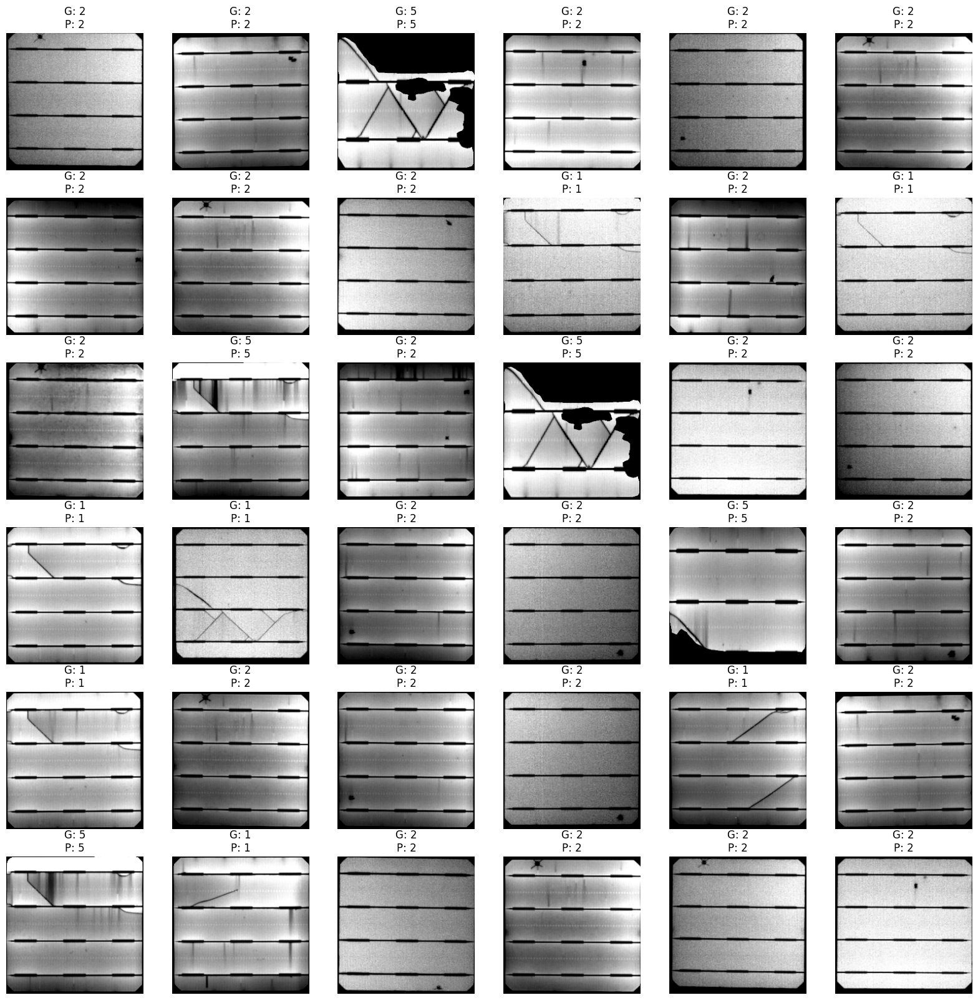

In [19]:
# plot correct samples
import numpy as np
import matplotlib.pyplot as plt
fig, ax = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
for i in range(6):
    for j in range(6):
        while True:
            idx = np.random.choice(ds_test_inf.shape[0], 1, replace=False)
            if ds_test_inf[int(idx[0])]["labels"] > 0 and ds_test_inf[int(idx[0])]["labels"] == predlabels_inf[int(idx[0])]:
                break
        s = ds_test_inf[int(idx[0])]
        ax[i,j].imshow(np.transpose(s['pixel_values'], (1,2,0)))
        ax[i,j].set_title(f"G: {s['labels']}\nP: {predlabels_inf[int(idx[0])]}")
        ax[i,j].axis('off')

plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.41960787773132324].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9764705896377563].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9921568632125854].
Clipping input data to 

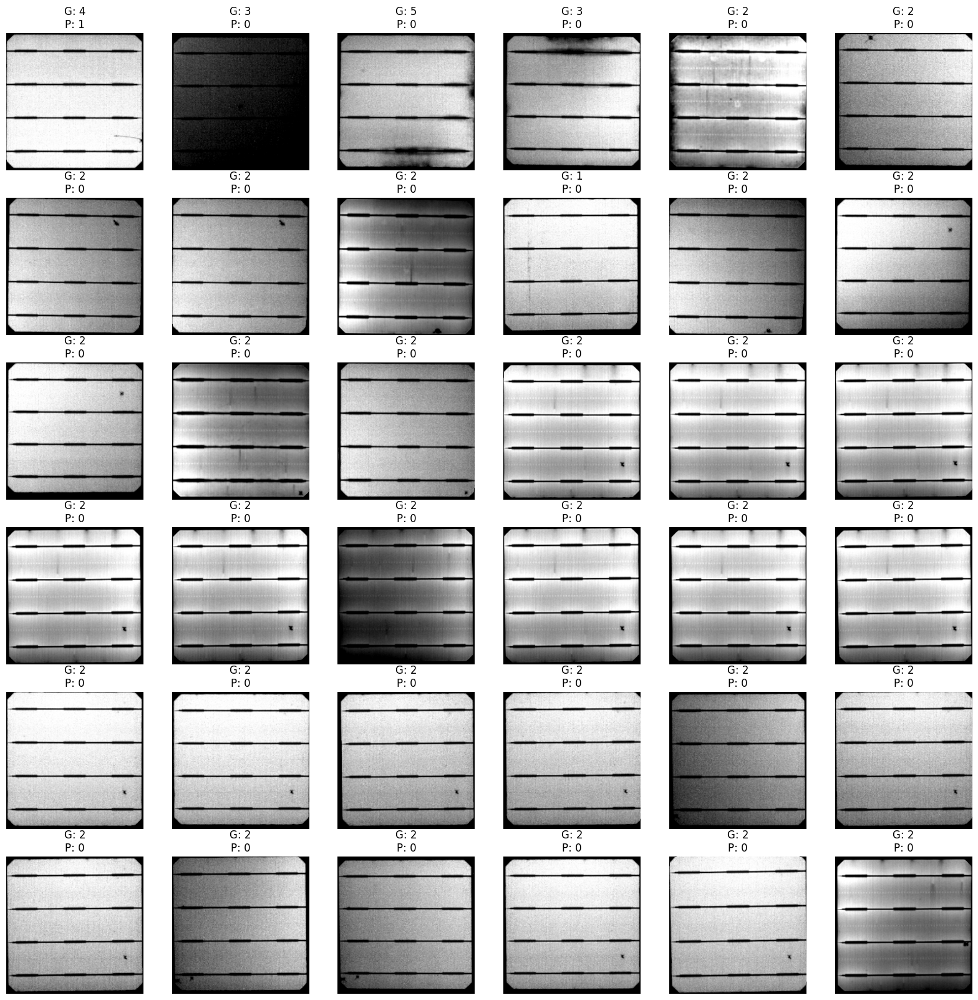

In [20]:

# plot wrong samples
idx = -1
fig, ax = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
for i in range(6):
    for j in range(6):
        for id in np.where(ds_test_inf['labels'] != predlabels_inf)[0]:
            if id > idx:
                idx = int(id)
                break
        if idx > -1:
            s = ds_test_inf[idx]
            ax[i,j].imshow(np.transpose(s['pixel_values'], (1,2,0)))
            ax[i,j].set_title(f"G: {s['labels']}\nP: {predlabels_inf[idx]}")
            ax[i,j].axis('off')
plt.show()

# WEBSITE

In [24]:
import os
import sys
import importlib

current_dir = '/Users/eagle/Documents/eagle-classification/'
sys.path.append(os.path.join(current_dir, 'eagle-jsonhandler'))
sys.path.append(os.path.join(current_dir, '../'))
eagle_jsonhandler = importlib.import_module("JSONHandler")
PATH = "/Users/eagle/Library/CloudStorage/OneDrive-SharedLibraries-FFHS/eagle-bfe - data/Webpage"
panellist = eagle_jsonhandler.getGroupedPanelList(PATH+'/overviews/')
classified_cells = []
for classified_by_one in ["Ebrar", 'Ralf']:
    classified_cells.extend(eagle_jsonhandler.getCellsByAttribute(groupedPanels=panellist, attribute="classifiedBy", values=classified_by_one))

elpaths, uvpaths, vispaths, labels = eagle_jsonhandler.getCellsImagePathsAndLabels(classified_cells)
print(elpaths)


['23-P09-A/23-P09-A1_EL_Cell008.tif', '23-P09-A/23-P09-A1_EL_Cell017.tif', '23-P09-B/23-P09-B1_EL_Cell117.tif', '23-P09-B/23-P09-B2_EL_Cell112.tif', '23-P09-B/23-P09-B3_EL_Cell085.tif', '23-P09-B/23-P09-B3_EL_Cell095.tif', '23-P09-B/23-P09-B4_EL_Cell114.tif', '23-P09-B/23-P09-B5_EL_Cell001.tif', '23-P09-B/23-P09-B5_EL_Cell002.tif', '23-P09-B/23-P09-B5_EL_Cell003.tif', '23-P09-B/23-P09-B5_EL_Cell077.tif', '23-P09-B/23-P09-B5_EL_Cell078.tif', '23-P09-B/23-P09-B5_EL_Cell118.tif', '23-P09-C/23-P09-C1_EL_Cell029.tif', '23-P09-C/23-P09-C1_EL_Cell031.tif', '23-P09-C/23-P09-C1_EL_Cell033.tif', '23-P09-C/23-P09-C1_EL_Cell034.tif', '23-P09-C/23-P09-C1_EL_Cell044.tif', '23-P09-C/23-P09-C1_EL_Cell045.tif', '23-P09-C/23-P09-C1_EL_Cell046.tif', '23-P09-C/23-P09-C1_EL_Cell049.tif', '23-P09-C/23-P09-C1_EL_Cell068.tif', '23-P09-C/23-P09-C1_EL_Cell070.tif', '23-P09-C/23-P09-C1_EL_Cell091.tif', '23-P09-C/23-P09-C1_EL_Cell092.tif', '23-P09-C/23-P09-C1_EL_Cell096.tif', '23-P09-C/23-P09-C1_EL_Cell098.tif', 

In [55]:
def rescale_images_to_0_255(images, per_image=True):
    """
    Rescale the R channel to 0-255 and copy the rescaled R into G and B.
    Returns list of PIL.Image (RGB, uint8).
    """
    out = []
    if not per_image:
        # compute global red-channel min/max
        red_min = np.inf
        red_max = -np.inf
        arrs = []
        for im in images:
            if isinstance(im, Image.Image):
                a = np.asarray(im.convert("RGB")).astype(np.float32)
            else:
                a = np.asarray(im).astype(np.float32)
                if a.ndim == 2:
                    a = np.stack([a] * 3, axis=-1)
                elif a.ndim == 3 and a.shape[-1] != 3:
                    a = a[..., :3]
            arrs.append(a)
            rmin = float(a[..., 0].min())
            rmax = float(a[..., 0].max())
            red_min = min(red_min, rmin)
            red_max = max(red_max, rmax)
        # scale using global red range, then replicate to RGB
        for a in arrs:
            if red_max > red_min:
                r = (a[..., 0] - red_min) / (red_max - red_min) * 255.0
            else:
                r = np.zeros_like(a[..., 0], dtype=np.float32)
            r = np.clip(r, 0, 255).astype(np.uint8)
            rgb = np.stack([r, r, r], axis=-1)
            out.append(Image.fromarray(rgb))
        return out

    # per-image scale: scale red channel per image then replicate
    for im in images:
        if isinstance(im, Image.Image):
            im_rgb = im.convert("RGB")
            arr = np.asarray(im_rgb).astype(np.float32)
        else:
            arr = np.asarray(im).astype(np.float32)
            if arr.ndim == 2:
                arr = np.stack([arr] * 3, axis=-1)
            elif arr.ndim == 3 and arr.shape[-1] != 3:
                arr = arr[..., :3]
        mn = float(arr[..., 0].min())
        mx = float(arr[..., 0].max())
        if mx > mn:
            r = (arr[..., 0] - mn) / (mx - mn) * 255.0
        else:
            r = np.zeros_like(arr[..., 0], dtype=np.float32)
        r = np.clip(r, 0, 255).astype(np.uint8)
        rgb = np.stack([r, r, r], axis=-1)
        out.append(Image.fromarray(rgb))
    return out



In [56]:
# ...existing code...
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
from PIL import Image

def summarize_image_list(imgs, name="images", n_preview=6):
    print(f"--- {name} summary ---")
    types = Counter([type(x).__name__ for x in imgs])
    print("types:", types)
    # enforce convertable to numpy
    shapes = Counter()
    modes = Counter()
    mins, maxs, means, stds = [], [], [], []
    channel_sums = None
    count = 0
    for i, im in enumerate(imgs):
        try:
            if isinstance(im, Image.Image):
                modes.update([im.mode])
                arr = np.asarray(im.convert("RGB")).astype(np.float32)  # force RGB for stats
            else:
                arr = np.asarray(im)
                if arr.ndim == 2:
                    arr = np.stack([arr]*3, axis=-1)
                elif arr.ndim == 3 and arr.shape[-1] != 3:
                    # try to slice or convert to 3 channels
                    arr = arr[..., :3]
            shapes.update([arr.shape])
            print(arr[:,:,0].max(),'0 channel mean')
            print(arr[:,:,1].max(),'1 channel mean')
            print(arr[:,:,2].max(),'2 channel mean')
            mins.append(float(arr.min()))
            maxs.append(float(arr.max()))
            means.append(float(arr.mean()))
            stds.append(float(arr.std()))
            if channel_sums is None:
                channel_sums = np.zeros(arr.shape[-1], dtype=np.float64)
            # channel means accumulate
            channel_sums += arr.reshape(-1, arr.shape[-1]).mean(axis=0)
            count += 1
        except Exception as e:
            print(f" skip sample {i}: {e}")
    if count == 0:
        print("no valid images")
        return
    print("count:", count)
    print("modes:", dict(modes))
    print("shapes (sampled):", dict(shapes))
    print(f"global min/max mean/std: min={np.min(mins):.3f}, max={np.max(maxs):.3f}, mean={np.mean(means):.3f}, std={np.mean(stds):.3f}")
    chans = (channel_sums / count).tolist() if channel_sums is not None else None
    if chans:
        print("approx per-channel mean (RGB):", [f"{c:.3f}" for c in chans])
    # preview images
    plt.figure(figsize=(12,3))
    for i in range(min(n_preview, len(imgs))):
        plt.subplot(1, n_preview, i+1)
        im = imgs[i]
        if not isinstance(im, Image.Image):
            im = Image.fromarray(np.asarray(im).astype(np.uint8))
        plt.imshow(im.convert("RGB"))
        plt.axis("off")
    plt.suptitle(f"{name} - first {min(n_preview,len(imgs))} samples")
    plt.show()



In [ ]:
import os
import numpy as np
from PIL import Image
import pandas as pd
from datasets import Dataset

# decode a TIFF path to a PIL image (RGB) and resize
def decode_img_pil(img_path, size=(256, 256)):
    try:
        img = Image.open('/Users/eagle/Library/CloudStorage/OneDrive-SharedLibraries-FFHS/eagle-bfe - data/Webpage/bboxes/'+img_path)
        img = img.convert("RGB")
        img = img.resize(size, Image.LANCZOS)
        return img
    except Exception as e:
        # skip or log bad files
        print(f"skip {img_path}: {e}")
        return None

# extract images (and optional labels) from a list/iterable of file paths
def extract_original_images_from_paths(paths, labels):
    images = []
    for p in paths:
        img = decode_img_pil(p)
        if img is None:
            continue
        images.append(img)  
    labels_cat =[np.argmax(v) for v in labels] # same label extraction as before
    return images, labels_cat

# Usage: ensure `elpaths` is a list/iterable of full file paths (strings)
# e.g. elpaths, uvpaths, vispaths, labels = eagle_jsonhandler.getCellsImagePathsAndLabels(classified_cells)
# flatten or choose the list you want to use (here: use elpaths)
data_paths = elpaths  # must be a Python list of file paths

original_images, original_labels = extract_original_images_from_paths(data_paths, labels)

# build dataframe in the same format your pipeline expects (batch_transform expects 'images' key)
df_web = pd.DataFrame({"images": original_images, "labels": original_labels})

# Apply to df_web images (per-image scaling)
df_web['images'] = rescale_images_to_0_255(df_web['images'], per_image=True)

# reuse your existing batch_transform / extractor to get pixel_values
df_web_transformed = batch_transform(df_web)

# make a HuggingFace Dataset if you need it for trainer.predict
ds_web = Dataset.from_dict({
    "pixel_values": df_web_transformed.pixel_values,
    "labels": df_web_transformed.labels
})


# Re-run your checks / transform
summarize_image_list(df_web['images'][:200], name="df_web (after rescale)")


In [ ]:
# Run summaries before batch_transform
print("Extractor info (check expected input):", getattr(extractor, "size", None), getattr(extractor, "do_resize", None))
summarize_image_list(df_inf['images'][:200], name="df_inf (raw) sample")
summarize_image_list(df_web['images'][:200], name="df_web (raw) sample")

# Quick numeric comparison on a small sample
def quick_compare(a_imgs, b_imgs, n=50):
    def stats(imgs):
        arrs = []
        for im in imgs[:n]:
            if isinstance(im, Image.Image):
                arr = np.asarray(im.convert("RGB")).astype(np.float32)
            else:
                arr = np.asarray(im)
                if arr.ndim == 2:
                    arr = np.stack([arr]*3, axis=-1)
                elif arr.ndim == 3 and arr.shape[-1] != 3:
                    arr = arr[..., :3]
            arrs.append(arr)
        arr = np.stack([np.mean(x) for x in arrs])
        return arr.mean(), arr.std(), arr.min(), arr.max()
    print("A mean,std,min,max:", stats(a_imgs))
    print("B mean,std,min,max:", stats(b_imgs))

quick_compare(df_inf['images'], df_web['images'], n=100)
# ...existing code...

In [50]:
df_web_transformed['pixel_values'][0].min()

tensor(-0.9922)

In [59]:
predictions_web = trainer_from_file.predict(ds_web)
predlabels_web = predictions_web.predictions.argmax(axis=-1)
predictions_web.metrics

{'test_loss': 2.235020637512207,
 'test_model_preparation_time': 0.0062,
 'test_runtime': 68.2481,
 'test_samples_per_second': 10.608,
 'test_steps_per_second': 0.674}

In [62]:
num_labels = 7
confusion_matirx = np.zeros((num_labels, num_labels), dtype=int)
for true_label, pred_label in zip(predictions_web.label_ids, predlabels_web):
    confusion_matirx[true_label, pred_label] += 1
print(confusion_matirx)

[[145   2   4   0   7  13   4]
 [ 12  10   5   0  28  35  19]
 [ 24   0   5   0   3   5   1]
 [ 80   0   3   0  17  74  30]
 [  8   1   2   0  14  22  31]
 [ 40   0   4   0   2   4   0]
 [  9   1  12   0  40   5   3]]


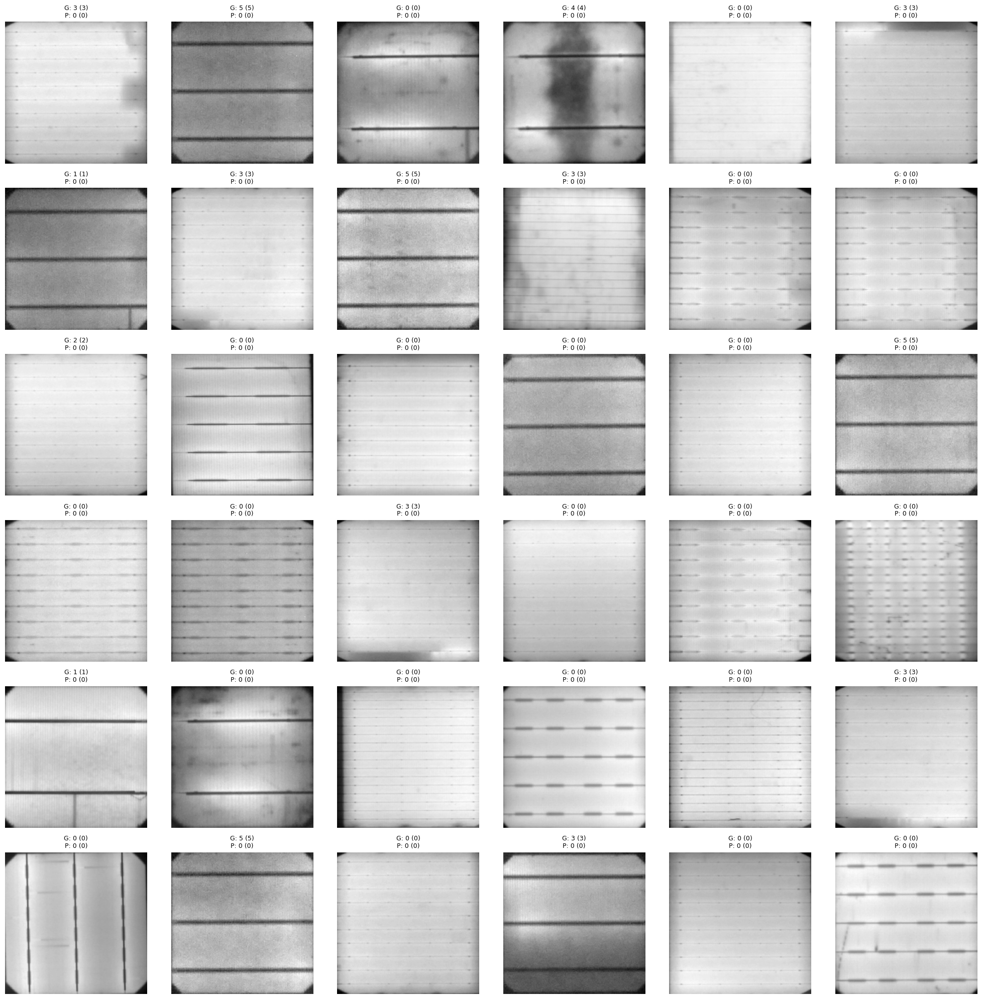

In [71]:
# ...existing code...
def pv_to_display(pv, extractor=None):
    """Convert pixel_values (torch/numpy, possibly normalized) -> HWC uint8 image for plt.imshow."""
    import numpy as np
    # convert torch tensor -> numpy
    if hasattr(pv, "numpy"):
        arr = pv.numpy()
    else:
        arr = np.asarray(pv)

    # handle batched (1, C, H, W)
    if arr.ndim == 4 and arr.shape[0] == 1:
        arr = arr[0]

    # channel-first (C, H, W) -> H, W, C
    if arr.ndim == 3 and arr.shape[0] in (1, 3):
        arr = np.transpose(arr, (1, 2, 0))

    # If already uint8, just clip
    if arr.dtype == np.uint8:
        return np.clip(arr, 0, 255)

    # try to undo extractor normalization if available
    try:
        if extractor is not None and hasattr(extractor, "image_mean") and hasattr(extractor, "image_std"):
            mean = np.array(extractor.image_mean).reshape(1, 1, -1)
            std = np.array(extractor.image_std).reshape(1, 1, -1)
            # if input is channel-first originally, above transpose handled it
            arr = arr * std + mean
    except Exception:
        pass

    # common cases: values in [0,1] -> scale by 255
    amax = arr.max()
    amin = arr.min()
    if amax <= 1.1 and amin >= -0.1:
        arr = (arr - (0.0 if amin >= 0 else amin))  # shift small negatives if present
        arr = arr * 255.0
    else:
        # otherwise linearly rescale to 0-255
        if amax > amin:
            arr = (arr - amin) / (amax - amin) * 255.0
        else:
            arr = np.zeros_like(arr)

    return np.clip(arr, 0, 255).astype(np.uint8)


# plotting class 1 samples (replace previous cell)
class_idx = np.where(np.array(predlabels_web) == 0)[0]
n_display = min(36, len(class_idx))

if n_display == 0:
    print("No predicted class 1 samples found.")
else:
    sel = np.random.choice(class_idx, size=n_display, replace=False)
    fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
    axes = axes.flatten()
    for ax, idx in zip(axes, sel):
        s = ds_web[int(idx)]
        pv = s['pixel_values']
        img = pv_to_display(pv, extractor=extractor)  # reuse helper
        # get true label (dataset stores labels) and predicted label
        try:
            true = int(s['labels'])
        except Exception:
            true = int(np.asarray(s['labels']).item())
        pred = int(predlabels_web[int(idx)])
        # optional mapping to human names if label_names exists
        try:
            true_name = label_names.get(true, true)
            pred_name = label_names.get(pred, pred)
        except Exception:
            true_name, pred_name = true, pred
        ax.imshow(img)
        ax.set_title(f"G: {true_name} ({true})\nP: {pred_name} ({pred})", fontsize=9)
        ax.axis('off')
    for ax in axes[n_display:]:
        ax.axis('off')
    plt.tight_layout()
    plt.show()
# ...existing code...

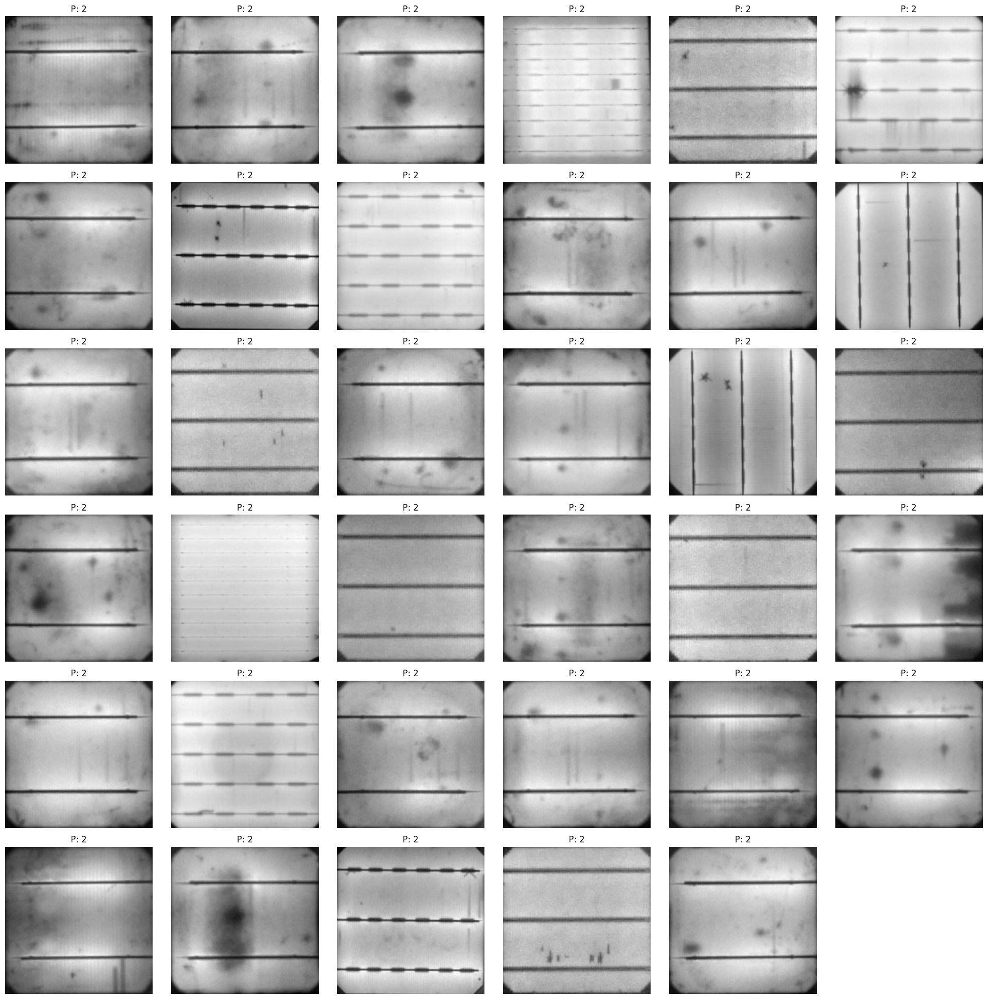

In [68]:
# ...existing code...
def pv_to_display(pv, extractor=None):
    """Convert pixel_values (torch/numpy, possibly normalized) -> HWC uint8 image for plt.imshow."""
    import numpy as np
    # convert torch tensor -> numpy
    if hasattr(pv, "numpy"):
        arr = pv.numpy()
    else:
        arr = np.asarray(pv)

    # handle batched (1, C, H, W)
    if arr.ndim == 4 and arr.shape[0] == 1:
        arr = arr[0]

    # channel-first (C, H, W) -> H, W, C
    if arr.ndim == 3 and arr.shape[0] in (1, 3):
        arr = np.transpose(arr, (1, 2, 0))

    # If already uint8, just clip
    if arr.dtype == np.uint8:
        return np.clip(arr, 0, 255)

    # try to undo extractor normalization if available
    try:
        if extractor is not None and hasattr(extractor, "image_mean") and hasattr(extractor, "image_std"):
            mean = np.array(extractor.image_mean).reshape(1, 1, -1)
            std = np.array(extractor.image_std).reshape(1, 1, -1)
            # if input is channel-first originally, above transpose handled it
            arr = arr * std + mean
    except Exception:
        pass

    # common cases: values in [0,1] -> scale by 255
    amax = arr.max()
    amin = arr.min()
    if amax <= 1.1 and amin >= -0.1:
        arr = (arr - (0.0 if amin >= 0 else amin))  # shift small negatives if present
        arr = arr * 255.0
    else:
        # otherwise linearly rescale to 0-255
        if amax > amin:
            arr = (arr - amin) / (amax - amin) * 255.0
        else:
            arr = np.zeros_like(arr)

    return np.clip(arr, 0, 255).astype(np.uint8)


# plotting class 1 samples (replace previous cell)
import numpy as np
import matplotlib.pyplot as plt

class1_idx = np.where(np.array(predlabels_web) == 2)[0]
n_display = min(36, len(class1_idx))

if n_display == 0:
    print("No predicted class 1 samples found.")
else:
    sel = np.random.choice(class1_idx, size=n_display, replace=False)
    fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
    axes = axes.flatten()
    for ax, idx in zip(axes, sel):
        s = ds_web[int(idx)]
        pv = s['pixel_values']
        img = pv_to_display(pv, extractor=extractor)  # extractor optional
        ax.imshow(img)
        ax.set_title(f"P: {int(predlabels_web[int(idx)])}")
        ax.axis('off')
    for ax in axes[n_display:]:
        ax.axis('off')
    plt.tight_layout()
    plt.show()
# ...existing code...

# Duramat mono 3 (unlabeled)

In [51]:
import pandas as pd
path_all = "/Users/eagle/Documents/eagle-labelling/features_pickle/Duramat_all_no_pool.pkl"
path_all_max = "/Users/eagle/Documents/eagle-labelling/features_pickle/Duramat_all_maxpool.pkl"
df_all = pd.read_pickle(path_all)
df_all_max = pd.read_pickle(path_all_max)
df_mono_3 = df_all.loc[df_all_max["technology"]=="mono_3"]
df_mono_3 = batch_transform(df_mono_3)
ds_mono_3 = Dataset.from_dict({
                "pixel_values": df_mono_3.pixel_values,
                "labels": np.zeros(df_mono_3.pixel_values.shape[0])
            })
ds_mono_3

Dataset({
    features: ['pixel_values', 'labels'],
    num_rows: 807
})

In [52]:
df_mono_3['pixel_values'][0].min()

tensor(-0.8667)

In [53]:
predictions = trainer_from_file.predict(ds_mono_3)
predlabels = predictions.predictions.argmax(axis=-1)
predictions.metrics

RuntimeError: expected scalar type Long but found Float

In [ ]:
np.sum(predlabels != 0)

49

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

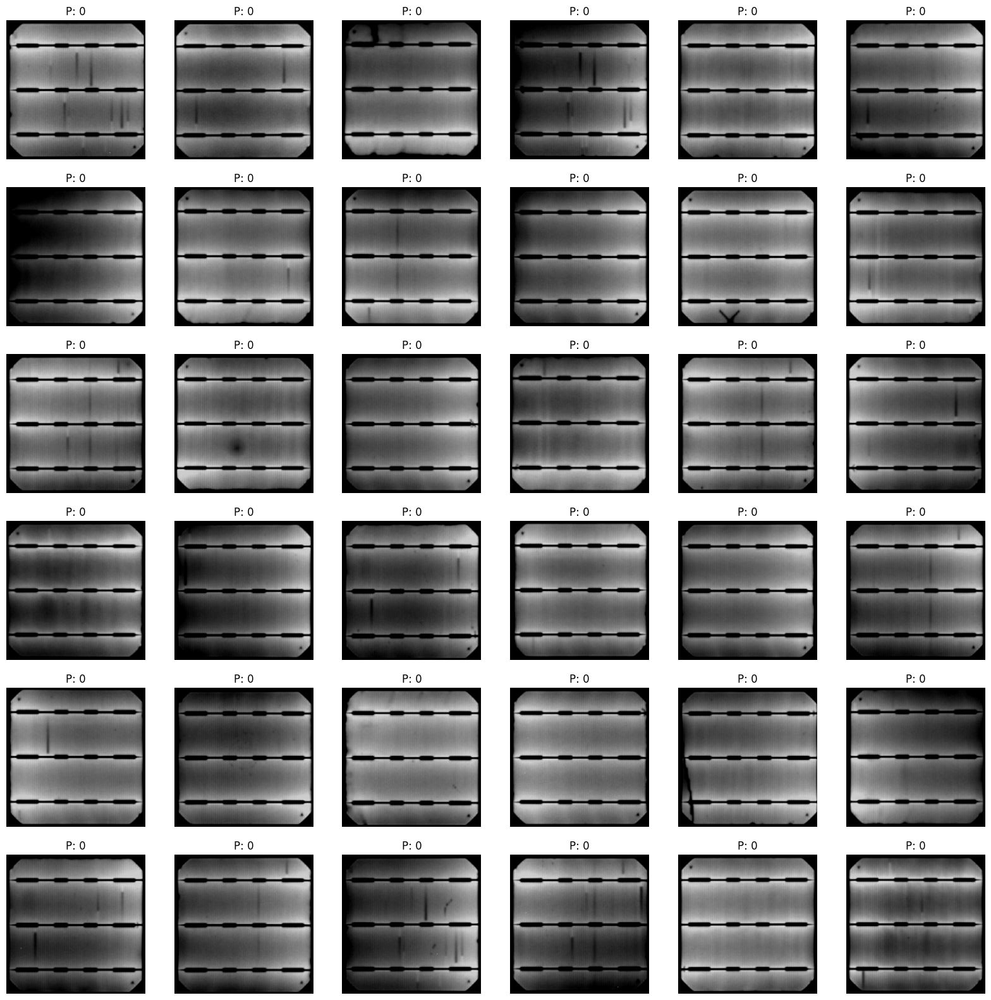

In [ ]:
# plot samples
import numpy as np
fig, ax = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
used = []
for i in range(6):
    for j in range(6):
        while True:
            idx = np.random.choice(ds_mono_3.shape[0], 1, replace=False)
            if predlabels[int(idx[0])] == 0 and idx not in used:
                used.append(idx)
                break
        s = ds_mono_3[idx]
        ax[i,j].imshow(np.transpose(s['pixel_values'][0], (1,2,0)))
        ax[i,j].set_title(f"P: {predlabels[int(idx[0])]}")
        ax[i,j].axis('off')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

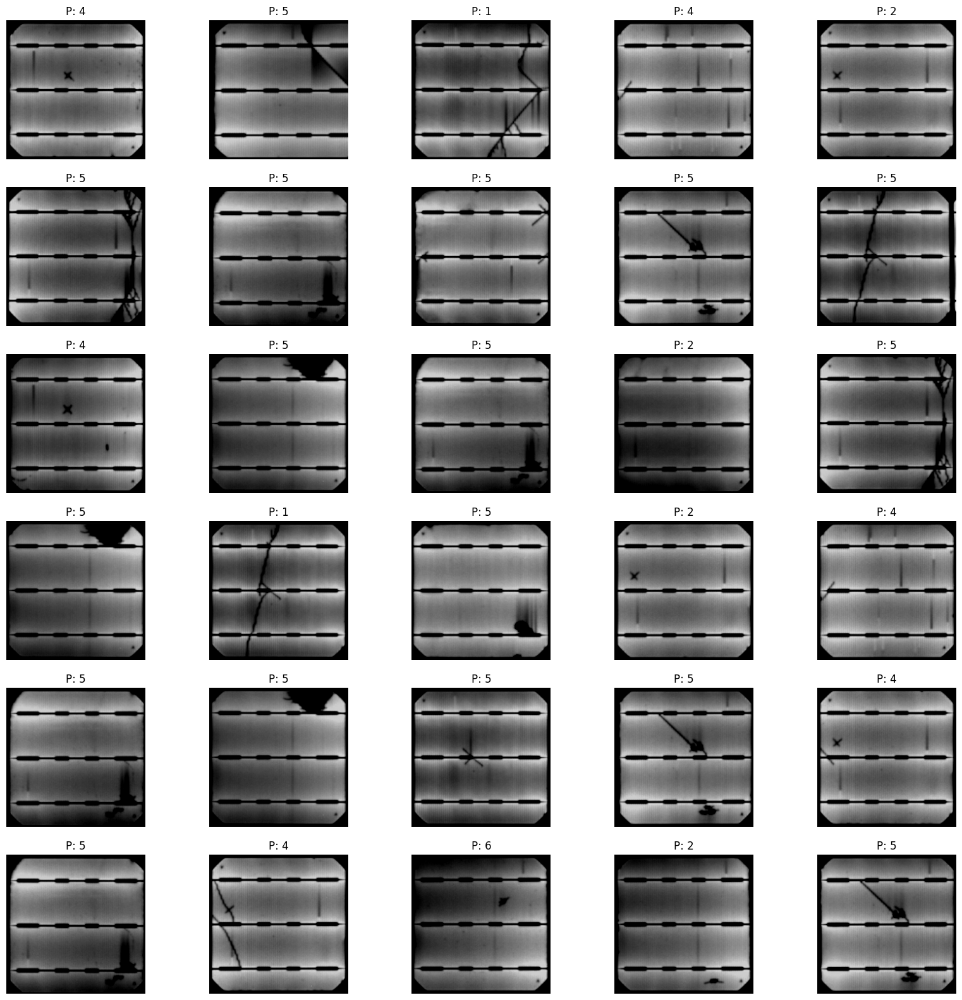

In [ ]:
# plot samples
import numpy as np
fig, ax = plt.subplots(6, 5, sharex=True, sharey=True, figsize=(20,20))
used = []
for i in range(6):
    for j in range(5):
        while True:
            idx = np.random.choice(ds_mono_3.shape[0], 1, replace=False)
            if predlabels[int(idx[0])] > 0 and idx not in used:
                used.append(idx)
                break
        s = ds_mono_3[idx]
        ax[i,j].imshow(np.transpose(s['image'][0], (1,2,0)))
        ax[i,j].set_title(f"P: {predlabels[int(idx[0])]}")
        ax[i,j].axis('off')
plt.show()

# Duramat Mono4 (unlabeled)

In [99]:
import tensorflow as tf

AttributeError: `np.complex_` was removed in the NumPy 2.0 release. Use `np.complex128` instead.

In [100]:
def extract_original_images(tf_dataset : tf.data.Dataset) -> np.ndarray:
    '''
    Function for the unsupervised case.
    Extracts the original images from a tf Dataset and saves them into a numpy array for further processing (e.g. with UMAP)
    This function assumes that offset = 0 and crop_size = image_size if cropped == none
    This function assumes it is working with images and not features extracted from images.
    '''
    images = []
    for batch_images in tf_dataset:
            for im in batch_images:
                images.append(np.array(im).astype(int))
 
    return images
 
directory = "/Users/eagle/Library/CloudStorage/OneDrive-SharedLibraries-FFHS/eagle-bfe - data/Webpage/bboxes/duramat_mono4_big"
data_ds_mono4 = tf.keras.utils.image_dataset_from_directory(
            directory=directory,
            labels=None,
            batch_size=128,
            #image_size=image_size,
            seed=42,
            #subset= subset,
            #validation_split=validation_split,
            shuffle = False)
 
original_images = extract_original_images(data_ds_mono4)
 
df_mono_4 = pd.DataFrame(data = {"images" : original_images, "labels": np.zeros(len(original_images))})

df_mono_4 = batch_transform(df_mono_4)
ds_mono_4 = Dataset.from_dict({
                "image": df_mono_4.pixel_values,
                "labels": np.zeros(df_mono_4.pixel_values.shape[0])
            })
ds_mono_4


NameError: name 'tf' is not defined

In [ ]:
predictions = trainer.predict(ds_mono_4)
predlabels = predictions.predictions.argmax(axis=-1)
predictions.metrics

{'test_loss': 0.41850829124450684,
 'test_accuracy': 0.901412429378531,
 'test_f1': 0.9481503491308869,
 'test_runtime': 578.0253,
 'test_samples_per_second': 18.373,
 'test_steps_per_second': 1.149}

In [ ]:
np.sum(predlabels != 0)

1047

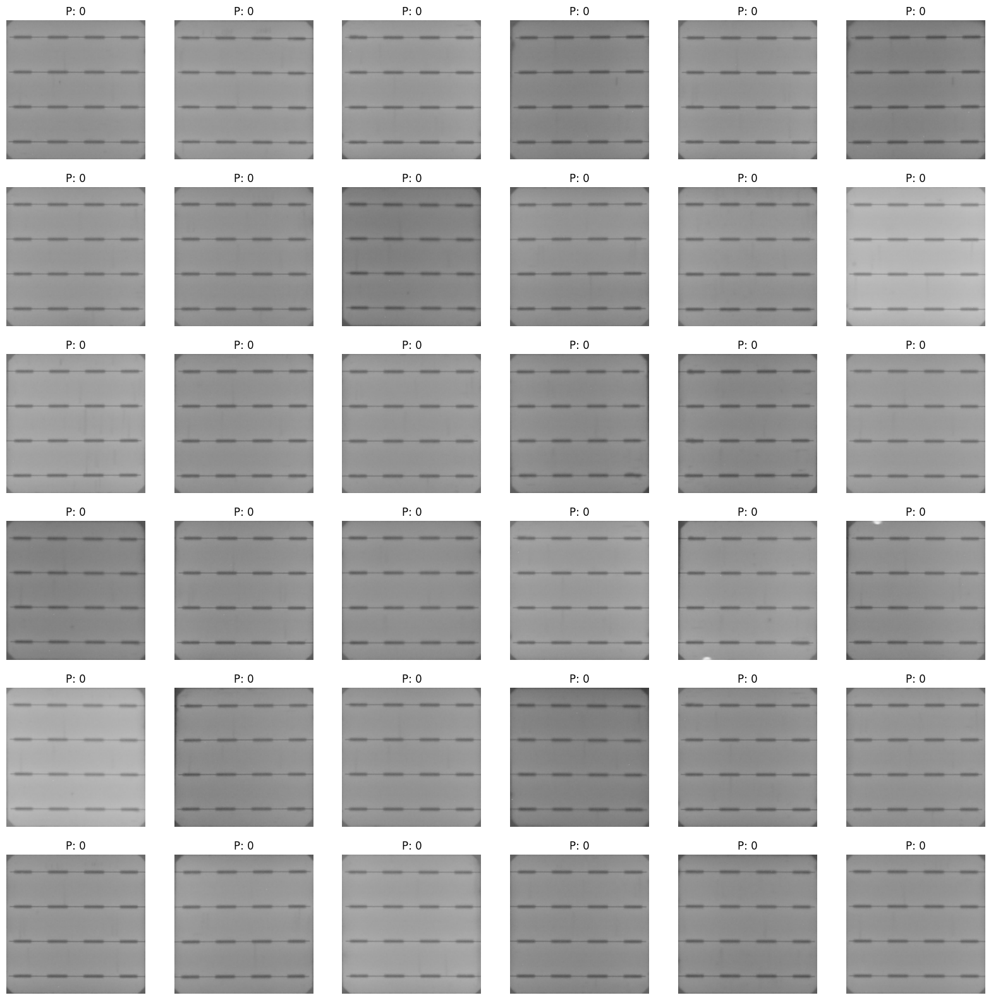

In [ ]:
# plot samples
import numpy as np
fig, ax = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
used = []
for i in range(6):
    for j in range(6):
        while True:
            idx = np.random.choice(ds_mono_4.shape[0], 1, replace=False)
            if predlabels[int(idx[0])] == 0 and idx not in used:
                used.append(idx)
                break
        s = original_images[int(idx[0])]
        ax[i,j].imshow(s)
        ax[i,j].set_title(f"P: {predlabels[int(idx[0])]}")
        ax[i,j].axis('off')
plt.show()

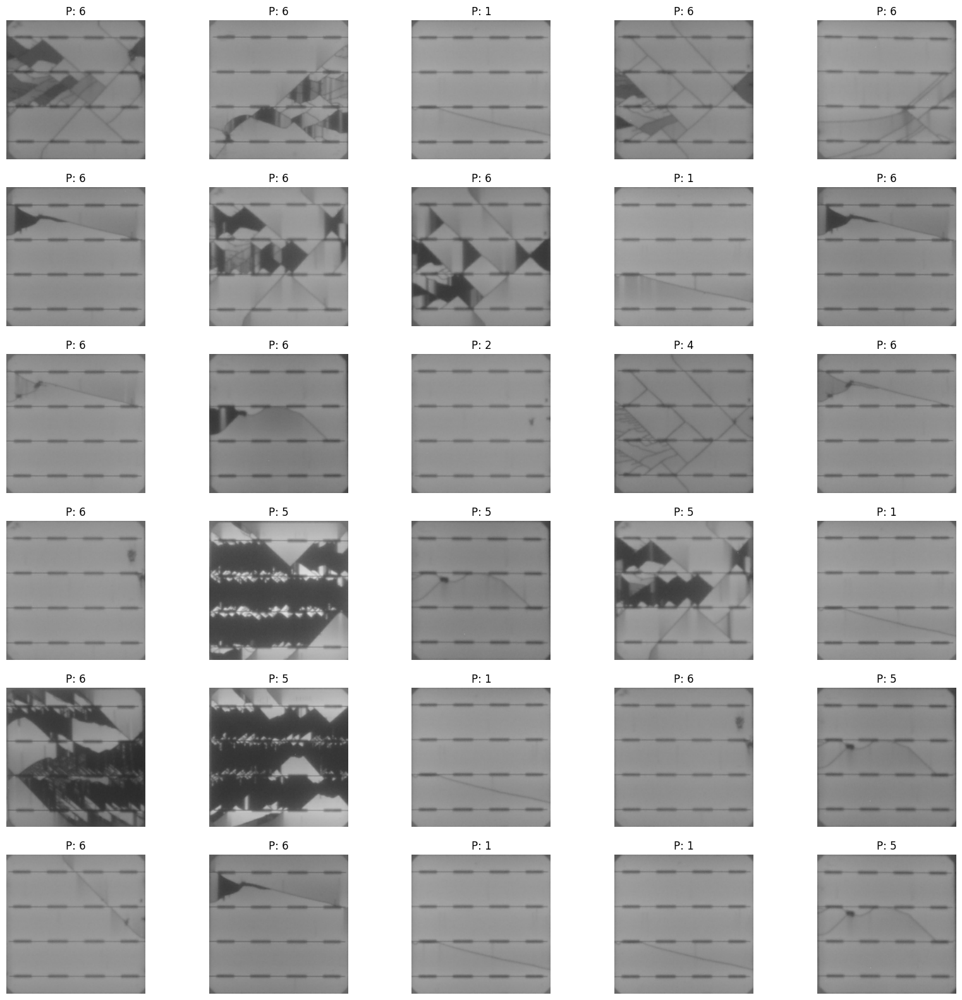

In [ ]:
# plot samples
import numpy as np
fig, ax = plt.subplots(6, 5, sharex=True, sharey=True, figsize=(20,20))
used = []
for i in range(6):
    for j in range(5):
        while True:
            idx = np.random.choice(ds_mono_4.shape[0], 1, replace=False)
            if predlabels[int(idx[0])] > 0 and idx not in used:
                used.append(idx)
                break
        s = original_images[int(idx[0])]
        ax[i,j].imshow(s)
        ax[i,j].set_title(f"P: {predlabels[int(idx[0])]}")
        ax[i,j].axis('off')
plt.show()

# TISO (unlabeled)

In [ ]:
import tensorflow_io as tf
print(tfio.version)

<module 'tensorflow_io.python.api.version' from '/Users/eagle/Documents/eagle-classification/venv_eagle_class/lib/python3.9/site-packages/tensorflow_io/python/api/version.py'>


In [22]:
import os
import numpy as np
import tensorflow as tf
import tensorflow_io as tfio
print(tfio.version)
directory = "/Users/eagle/Library/CloudStorage/OneDrive-SharedLibraries-FFHS/eagle-bfe - data/Webpage/bboxes/TISO-EAGLE-23-P09_images"
def decode_img(img_path):
    img = tf.io.read_file(img_path)
   # img = tfio.image.decode_tiff(img, channels=3)  # Adjust channels as necessary
    img = tf.image.resize(img, [256, 256])  # Resize to desired dimensions
    return img

# Function to process the dataset
def process_path(file_path):
    label = tf.strings.split(file_path, os.path.sep)[-2]
    img = decode_img(file_path)
    return img, label

def LoadTiffDS(directory):
# Create dataset from directory
    data_ds = tf.data.Dataset.list_files(os.path.join(directory, '*.tif'))
    data_ds = data_ds.map(process_path, num_parallel_calls=tf.data.experimental.AUTOTUNE)

    # Shuffle and batch the dataset
    data_ds = data_ds.shuffle(buffer_size=1000)
    data_ds = data_ds.batch(batch_size=128)
    data_ds = data_ds.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
    return data_ds

data_ds_tiso = LoadTiffDS(directory)
 
original_images = extract_original_images(data_ds_tiso)
 
df_tiso = pd.DataFrame(data = {"pixel_value" : original_images, "labels": np.zeros(len(original_images))})

df_tiso = batch_transform(df_tiso)
ds_tiso = Dataset.from_dict({
                "image": df_tiso.pixel_values,
                "labels": np.zeros(df_tiso.pixel_values.shape[0])
            })
ds_tiso

<module 'tensorflow_io.python.api.version' from '/Users/eagle/Documents/eagle-classification/venv_eagle_class/lib/python3.9/site-packages/tensorflow_io/python/api/version.py'>


ValueError: in user code:

    File "/var/folders/s4/l6k_zf9573j5vh_2y0qy50sc0000gx/T/ipykernel_19606/1497867468.py", line 16, in process_path  *
        img = decode_img(file_path)
    File "/var/folders/s4/l6k_zf9573j5vh_2y0qy50sc0000gx/T/ipykernel_19606/2434789643.py", line 10, in decode_img  *
        img = tf.image.resize(img, [256, 256])  # Resize to desired dimensions

    ValueError: 'images' must have either 3 or 4 dimensions.


In [ ]:
predictions = trainer.predict(ds_tiso)
predlabels = predictions.predictions.argmax(axis=-1)
predictions.metrics

In [ ]:
np.sum(predlabels == 0)

In [ ]:
np.sum(predlabels != 0)

In [ ]:
# plot samples
import numpy as np
fig, ax = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
used = []
for i in range(6):
    for j in range(6):
        while True:
            idx = np.random.choice(ds_tiso.shape[0], 1, replace=False)
            if predlabels[int(idx[0])] == 0 and idx not in used:
                used.append(idx)
                break
        s = original_images[int(idx[0])]
        ax[i,j].imshow(s)
        ax[i,j].set_title(f"P: {predlabels[int(idx[0])]}")
        ax[i,j].axis('off')
plt.show()

In [ ]:
# plot samples
import numpy as np
fig, ax = plt.subplots(6, 5, sharex=True, sharey=True, figsize=(20,20))
used = []
for i in range(6):
    for j in range(5):
        while True:
            idx = np.random.choice(ds_tiso.shape[0], 1, replace=False)
            if predlabels[int(idx[0])] > 0 and idx not in used:
                used.append(idx)
                break
        s = original_images[int(idx[0])]
        ax[i,j].imshow(s)
        ax[i,j].set_title(f"P: {predlabels[int(idx[0])]}")
        ax[i,j].axis('off')
plt.show()